## Setup and Dependencies

In [0]:
!pip install lightgbm
!pip install catboost

Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using dbutils.library.restartPython() to use updated packages.


In [0]:
dbutils.library.restartPython()

## Parameters and Imports

In [0]:
#  — Parameters & Imports
from pyspark.sql import functions as F, types as T

# Target setup
TARGET_COL = "sni_label"
NON_AGING_VALUES = ["NON-AGING", "CONSOLIDATED INVOICE - F"]  # mapped to 0
TARGET_RECALL = 0.80  # desired recall when tuning threshold on validation

# If exporting to Pandas
SAMPLE_FRACTION = 1.0
SAMPLE_SEED = 42

# Tokens that should be treated as missing
MISSING_TOKENS = ['?', 'NA', 'N/A', 'na', 'n/a', '']

## Load Dataset

In [0]:
# ====  Load the origin table ====
sni_df = spark.read.table(
    "supplychain.shipped_not_invoiced.fact_enterprise_shipped_not_invoiced_legacy_combined_reporting_view"
)
print(f"Loaded rows: {sni_df.count():,}")

Loaded rows: 5,881,632


In [0]:
# Get the maximum snapshot (Dm_Date) available in the SNI dataset
from pyspark.sql import functions as F

max_dm_df = (
    sni_df
    .select(F.max("Dm_Date").alias("max_dm_date"))
)

### Filter Latest Snapshot and Deduplicate

In [0]:
# Filter for records with the maximum Dm_Date and remove duplicates
max_date_value = max_dm_df.collect()[0]["max_dm_date"]

sni_df = (
    sni_df
    .filter(F.col("Dm_Date") == max_date_value)
    .dropDuplicates(["Sales_Order_Identifier", "Sales_Order_Line_Item_Identifier"])
)

In [0]:
sni_df = sni_df.filter(
    F.col("Shipment_Date") >= F.to_date(F.lit("2021-01-01"))
)

In [0]:
display(sni_df)

Order_Scenario,Source_System_Identifier,Logical_Deletion_Indicator,Insert_GMT_Timestamp,Update_GMT_Timestamp,Load_Job_Number,Source_System_Extract_GMT_Timestamp,Source_System_Update_Timestamp,Sales_Order_Type_Code,Sales_Order_Identifier,Sales_Order_Line_Item_Identifier,Sales_Order_Line_Item_Product_Id,Sales_Order_Line_Item_Quantity,Sold_To_Party,Ship_To_Party_Header,Plant_Code,Shipping_Point_Code,Sales_Office_Code,Sales_Organization_Code,Sales_Order_Distribution_Channel_Code,Sales_Order_Schedule_Line_Material_Availability_Date,Sales_Order_Header_Create_Date,Header_User_Status,Item_User_Status,Vbak_Vbeln_Vbap_Posnr_Zsa_Userstatus_Cat_Block_Category,Vbak_Vbeln_Zsa_Userstatus_Cat_Block_Category,Shipment_Identifier,Shipment_Line_Item_Identifier,Shipment_Create_Date,Shipment_Quantity,Shipment_Bill_Of_Lading_Identifier,Shipment_Date,Actual_Quantity_Delivered,Planned_Shipment_Date,Sales_Order_Delivery_Block_Code,Sales_Order_Header_Billing_Block_Code,Sales_Order_Line_Item_Billing_Block,Sales_Order_Single_Invoice_Flag,Sales_Order_Header_Created_By,Merged_Product_Hierarchy_Sales_Product_With_Option_Nr,Merged_Product_Hierarchy_Sales_Product_Nr,Merged_Product_Hierarchy_Product_Type_Nm,Merged_Product_Hierarchy_Product_Type_Dn,Merged_Product_Hierarchy_Product_Type_Cd,Merged_Product_Hierarchy_Product_Platform_Dn,Merged_Product_Hierarchy_Product_Line_Nm,Merged_Product_Hierarchy_Business_Segment_Nm,Merged_Product_Hierarchy_Business_Group_Dn,Merged_Product_Hierarchy_Business_Group_Cd,Merged_Product_Hierarchy_Business_Area_Product_Line_Dn,Product_Line,Merged_Product_Hierarchy_Business_Area_Product_Category_Dn,sgbu,Business_Unit,Merged_Product_Hierarchy_Base_Product_Nr,Merged_Product_Hierarchy_Base_Product_Nm,Merged_Product_Hierarchy_Base_Product_Dn,Fulfillment_Program,Rtm_Description,Sales_Order_Line_Item_Item_Category_Code,So_Cbn_Contract_Id,Sales_Order_Line_Item_Parent_So_Id,Sales_Order_Line_Item_Deal_Identifier,Sales_Order_Shipping_Condition_Code,Sales_Order_Route_Code,Means_Of_Transport_Identifier,Mode_Of_Transport_Description,Sales_Order_Header_Serial_Number_Profile,So_Order_Route_Group_Id,Eol_Dt,Proof_Of_Delivery_Date,Sales_Order_Line_Item_Incoterms_Part_1,Sales_Order_Line_Item_Incoterms_Part_2,Delivery_Errd,Line_Item_Crdd_Date,Crdd,Customer_Reference,Customer_Purchase_No,Sales_Order_Delivery_Priority_Code,Tdd,Sales_Order_Line_Item_Slo_Sla_Days,Sales_Order_Line_Item_Tdd_Source_Num,Sales_Order_Line_Item_Tdd_Source_Desc,Sales_Order_Storage_Location_Code,Transportation_Group_Code,Ship_To_Party_Header_Name,Sold_To_Party_Name,Sold_To_Party_Country,Sold_To_Party_Country_Text,Sold_To_Party_Region_Text,Sold_To_Party_Region,End_Customer_Name,Customer_Segment_Code,Customer_Subsegment_Code,Customer_Subsegment_Description,Merged_Product_Hierarchy_Product_Category_Nm,Rtm,Shipment_Line_Item_Create_Date,So_Value_Added_Logistic_Services_Cd,Product_Type,Product_Type_Nm,Material_Type,Tsd,Item_User_Status_Description,Net_Shipped_Value_In_Document_Currency,So_Method_Cd,So_Method_Dn,Sales_Order_Line_Item_Item_Description,Delivery_Header_External_Identification_Of_Delivery_Note,Sub_Market,Market,Region,Country,Countryl6,Merged_Product_Hierarchy_Mfg_Product_Line_Cd,Sales_Order_Line_Item_Material_Group_2_Code,Sales_Order_Line_Item_Segment_Code,Mode_Of_Transport,End_Customer,gbu,Vbap_Matnr_Vbap_Werks_Cepct_Txtmdl4,Product_Category,Material_Category,Net_Price,Sales_Order_Type_Category,Sales_Order_Type_Description,Ship_To_Party,Sales_Order_Header_Billing_Trigger_Indicator,Shipment_Route_Code,Sales_Order_Line_Item_Partial_Delivery,Delivery_Line_Item_Delivery_Item_Partial_Delivery,Net_Shipped_Value_In_Usd_Currency,Net_Shipped_Value_In_Usd,Sales_Order_Line_Item_Document_Currency_Code,Sales_Purchase_Agreement_Identifier,Billing_Delay,Revenue_Delay,Alternate_Segment,sni_or_dni,Total_Sni,Total_Sni_Value_In_Usd,Total_Sni_Value_In_Document_Currency,Total_Order_Amount_Lc,Total_Order_Amount_Usd,Total_Net_Shipped_Value_In_Document_Currency,Matnr,Bwkey,Standard_Cost,Sub_Rtm,pla

## Create Target Label 

In [0]:
# ====  Create target label ====
sdf = (sni_df
    .withColumn("Aging_Indicator_norm", F.upper(F.trim(F.col("Aging_Indicator"))))
)

non_aging_up = [v.upper() for v in NON_AGING_VALUES]

sdf = (sdf
    .withColumn(
        TARGET_COL,
        F.when(F.col("Aging_Indicator_norm").isin(non_aging_up), F.lit(0))
         .otherwise(F.lit(1))
         .cast("int")
    )
)

# drop rows where label logic is unknown; here we don't expect nulls after otherwise(1)
# If you want to exclude null/blank indicators explicitly, uncomment:
# sdf = sdf.filter(F.col("Aging_Indicator").isNotNull())

# Quick prevalence check
sdf.groupBy(TARGET_COL).count().show()

+---------+------+
|sni_label| count|
+---------+------+
|        1|322500|
|        0|150480|
+---------+------+



## Define Feature Keep/Drop Lists

In [0]:
# ==== 3) Define feature keep/drop lists ====

# A) Pure IDs / names / free text (drop)
ID_LIKE_COLS = [
    "Order_Scenario","Source_System_Identifier","Sales_Order_Identifier",
    "Sales_Order_Line_Item_Identifier","Shipment_Identifier","Shipment_Line_Item_Identifier",
    "Sales_Order_Line_Item_Product_Id","Sales_Order_Header_Created_By",
    "So_Cbn_Contract_Id","Sales_Order_Line_Item_Parent_So_Id","Sales_Order_Line_Item_Deal_Identifier",
    "Sales_Contract_Id","Ic_Billing_Document_Id","Matnr","Bwkey",
    "Product_Bundle_Id","Pricing_Bundle_Id","Partner_Id","Trimmed_Partner_Id",
    "csr_name","csr_name_email_address","Customer_Reference","Customer_Purchase_No",
    "Sold_To_Party_Name","Ship_To_Party_Header_Name","Ship_To_Party_Header_Name4","End_Customer_Name",
    "Delivery_Header_External_Identification_Of_Delivery_Note","Vbap_Matnr_Vbap_Werks_Cepct_Txtmdl4"
]

# B) System timestamps / load fields (drop)
RAW_TIMESTAMP_OR_SYSTEM = [
    "Insert_GMT_Timestamp","Update_GMT_Timestamp","Load_Job_Number",
    "Source_System_Extract_GMT_Timestamp","Source_System_Update_Timestamp","dm_rfsh_dt"
]

# C) Raw dates to use for engineered deltas (keep temporarily; drop after deltas are created)
RAW_DATES_FOR_DELTAS = [
    "Sales_Order_Header_Create_Date","Shipment_Create_Date","Shipment_Date",
    "Planned_Shipment_Date","Proof_Of_Delivery_Date","Line_Item_Crdd_Date",
    "Crdd","Tdd","Tsd","planned_invoice_date","Eol_Dt","Ic_Billing_Date"
]

# D) Leakage (aging/SNI status/quantities/values that reveal the target; drop)
LEAKAGE_COLS = [
    "Aging_Indicator","Aging_Indicator_norm","Aging_Number",
    "Dm_Aging_Bk","Dm_Aging_Days","Dm_Flag","Dm_Date",
    "sni_or_dni","Total_Sni","Total_Sni_Value_In_Usd","Total_Sni_Value_In_Document_Currency",
    "Shipped_Not_Invoiced_Proof_of_Delivery_Calc_Number",
    "Shipped_Not_Invoiced_ORDER_STATUS","Shipped_Not_Invoiced_Invoiced_QUANTITY",
    "Shipped_Not_Invoiced_CC_SNI_QUANTITY","Shipped_Not_Invoiced_Total_SNI_Value_In_LC",
    "Shipped_Not_Invoiced_Total_Order_Amt","Shipped_Not_Invoiced_Net_Shipped_Value_LC",
    "Reason_For_Sni",
    "Sales_Order_Billing_Status","Sales_Order_Overall_Goods_Movement_Status",
    "Sales_Order_Item_Billing_Status","Sales_Order_Good_Movement_Status"
]

# E) Categorical features to keep (manageable cardinality, meaningful)
CAT_KEEP = [
    "Sales_Order_Type_Code","Plant_Code","Shipping_Point_Code","Sales_Organization_Code",
    "Sales_Order_Distribution_Channel_Code","Sales_Order_Delivery_Block_Code",
    "Sales_Order_Header_Billing_Block_Code","Sales_Order_Line_Item_Billing_Block",
    "Fulfillment_Program","Rtm_Description","Sales_Order_Line_Item_Item_Category_Code",
    "Sales_Order_Shipping_Condition_Code","Sales_Order_Route_Code","Mode_Of_Transport",
    "Sales_Order_Line_Item_Incoterms_Part_1","Sales_Order_Line_Item_Incoterms_Part_2",
    "Customer_Subsegment_Description","Region","Country","Business_Unit",
    "Product_Category","Material_Type","Product_Type","Product_Line","Shipment_Route_Code"
]

# F) Numeric features to keep (raw)
NUM_KEEP = [
    "Sales_Order_Line_Item_Quantity","Shipment_Quantity","Actual_Quantity_Delivered",
    "Net_Shipped_Value_In_Usd","Net_Shipped_Value_In_Document_Currency",
    "Total_Order_Amount_Usd","Total_Order_Amount_Lc","Standard_Cost",
    "Sales_Order_Line_Item_Slo_Sla_Days","Sales_Order_Line_Item_Tdd_Source_Num"
]

## Drop Unwanted Columns

In [0]:
# ====  Drop IDs, leakage, and system fields (keep raw dates for now) ====
existing_cols = set(sdf.columns)
drop_now = [c for c in (ID_LIKE_COLS + RAW_TIMESTAMP_OR_SYSTEM + LEAKAGE_COLS) if c in existing_cols]

sdf2 = sdf.drop(*drop_now)
print("Columns after initial drop:", len(sdf2.columns))

Columns after initial drop: 174


## Engineer Time-Delta Features

In [0]:
# ====  Engineer time-delta features & delivered ratio ====

# Convert date-like columns to timestamps
for d in RAW_DATES_FOR_DELTAS:
    if d in sdf2.columns:
        sdf2 = sdf2.withColumn(d, F.to_timestamp(F.col(d)))

# Datediff helper: int days (ok for modeling)
def days(a, b):
    return F.datediff(F.col(a), F.col(b)).cast("double")

# Create deltas if source columns exist
if {"Shipment_Date","Sales_Order_Header_Create_Date"} <= set(sdf2.columns):
    sdf2 = sdf2.withColumn("days_order_to_shipment", days("Shipment_Date","Sales_Order_Header_Create_Date"))

if {"Proof_Of_Delivery_Date","Shipment_Date"} <= set(sdf2.columns):
    sdf2 = sdf2.withColumn("days_shipment_to_pod", days("Proof_Of_Delivery_Date","Shipment_Date"))

if {"Shipment_Date","Planned_Shipment_Date"} <= set(sdf2.columns):
    sdf2 = sdf2.withColumn("days_planned_vs_actual_shipment", days("Shipment_Date","Planned_Shipment_Date"))

if {"planned_invoice_date","Sales_Order_Header_Create_Date"} <= set(sdf2.columns):
    sdf2 = sdf2.withColumn("days_order_to_planned_invoice", days("planned_invoice_date","Sales_Order_Header_Create_Date"))

if {"Crdd","Tdd"} <= set(sdf2.columns):
    sdf2 = sdf2.withColumn("days_crdd_minus_tdd", days("Crdd","Tdd"))

# Delivered ratio: Actual_Quantity_Delivered / Shipment_Quantity (clamp 0..5; handle division by zero)
if {"Actual_Quantity_Delivered","Shipment_Quantity"} <= set(sdf2.columns):
    sdf2 = (sdf2
        .withColumn("delivered_ratio",
            F.when(F.col("Shipment_Quantity").isNull() | (F.col("Shipment_Quantity") == 0), F.lit(0.0))
             .otherwise(F.col("Actual_Quantity_Delivered") / F.col("Shipment_Quantity"))
        )
        .withColumn("delivered_ratio",
            F.when(F.col("delivered_ratio") < 0, 0.0)
             .when(F.col("delivered_ratio") > 5, 5.0)
             .otherwise(F.col("delivered_ratio"))
        )
    )

# Build final feature lists present in data
ENGINEERED_NUM = [
    "days_order_to_shipment","days_shipment_to_pod","days_planned_vs_actual_shipment",
    "days_order_to_planned_invoice","days_crdd_minus_tdd","delivered_ratio"
]

final_num = [c for c in (NUM_KEEP + ENGINEERED_NUM) if c in sdf2.columns]
final_cat = [c for c in CAT_KEEP if c in sdf2.columns]

print("Final numeric features:", final_num)
print("Final categorical features:", final_cat)

# Drop raw dates (we keep only engineered features)
sdf2 = sdf2.drop(*[c for c in RAW_DATES_FOR_DELTAS if c in sdf2.columns])

Final numeric features: ['Sales_Order_Line_Item_Quantity', 'Shipment_Quantity', 'Actual_Quantity_Delivered', 'Net_Shipped_Value_In_Usd', 'Net_Shipped_Value_In_Document_Currency', 'Total_Order_Amount_Usd', 'Total_Order_Amount_Lc', 'Standard_Cost', 'Sales_Order_Line_Item_Slo_Sla_Days', 'Sales_Order_Line_Item_Tdd_Source_Num', 'days_order_to_shipment', 'days_shipment_to_pod', 'days_planned_vs_actual_shipment', 'days_order_to_planned_invoice', 'days_crdd_minus_tdd', 'delivered_ratio']
Final categorical features: ['Sales_Order_Type_Code', 'Plant_Code', 'Shipping_Point_Code', 'Sales_Organization_Code', 'Sales_Order_Distribution_Channel_Code', 'Sales_Order_Delivery_Block_Code', 'Sales_Order_Header_Billing_Block_Code', 'Sales_Order_Line_Item_Billing_Block', 'Fulfillment_Program', 'Rtm_Description', 'Sales_Order_Line_Item_Item_Category_Code', 'Sales_Order_Shipping_Condition_Code', 'Sales_Order_Route_Code', 'Mode_Of_Transport', 'Sales_Order_Line_Item_Incoterms_Part_1', 'Sales_Order_Line_Item_Inco

## Clean Placeholders and Enforce Dtypes

In [0]:
#  — Clean placeholders 

# Numeric columns: treat placeholders as NULL, then CAST to double
for c in final_num:
    if c in sdf2.columns:
        sdf2 = (sdf2
            .withColumn(
                c,
                F.when(F.col(c).cast("string").isin(MISSING_TOKENS), F.lit(None))
                 .otherwise(F.col(c))
            )
            .withColumn(c, F.col(c).cast(T.DoubleType()))
        )

# Categorical columns: trim and nullify placeholders
for c in final_cat:
    if c in sdf2.columns:
        sdf2 = (sdf2
            .withColumn(c, F.when(F.col(c).isNotNull(), F.trim(F.col(c).cast("string"))).otherwise(F.col(c)))
            .withColumn(c, F.when(F.col(c).isin(MISSING_TOKENS), F.lit(None)).otherwise(F.col(c)))
        )

## Select Model Columns and Export to Pandas

In [0]:
# ====  Select columns for sklearn ====
select_cols = final_num + final_cat + [TARGET_COL]
sdf3 = sdf2.select(*select_cols)

#  downsample to fit memory
if SAMPLE_FRACTION < 1.0:
    sdf3 = sdf3.sample(withReplacement=False, fraction=SAMPLE_FRACTION, seed=SAMPLE_SEED)

# Collect to Pandas
pdf = sdf3.toPandas()
print(pdf.shape, "memory-friendly sample" if SAMPLE_FRACTION < 1.0 else "full extract")

# Separate X and y
y = pdf[TARGET_COL].astype(int)
X = pdf.drop(columns=[TARGET_COL])

(472980, 42) full extract


In [0]:
display(sdf3)

Sales_Order_Line_Item_Quantity,Shipment_Quantity,Actual_Quantity_Delivered,Net_Shipped_Value_In_Usd,Net_Shipped_Value_In_Document_Currency,Total_Order_Amount_Usd,Total_Order_Amount_Lc,Standard_Cost,Sales_Order_Line_Item_Slo_Sla_Days,Sales_Order_Line_Item_Tdd_Source_Num,days_order_to_shipment,days_shipment_to_pod,days_planned_vs_actual_shipment,days_order_to_planned_invoice,days_crdd_minus_tdd,delivered_ratio,Sales_Order_Type_Code,Plant_Code,Shipping_Point_Code,Sales_Organization_Code,Sales_Order_Distribution_Channel_Code,Sales_Order_Delivery_Block_Code,Sales_Order_Header_Billing_Block_Code,Sales_Order_Line_Item_Billing_Block,Fulfillment_Program,Rtm_Description,Sales_Order_Line_Item_Item_Category_Code,Sales_Order_Shipping_Condition_Code,Sales_Order_Route_Code,Mode_Of_Transport,Sales_Order_Line_Item_Incoterms_Part_1,Sales_Order_Line_Item_Incoterms_Part_2,Customer_Subsegment_Description,Region,Country,Business_Unit,Product_Category,Material_Type,Product_Type,Product_Line,Shipment_Route_Code,sni_label
2.0,2.0,2.0,0.01,0.06,0.01,0.06,0.0,13.0,8.0,7.0,29.0,0.0,16.0,-21.0,1.0,ZOR1,SG65,2020,MY11,20,null,null,null,TRANSACTIONAL PC/PRINT,1,ZTB2,AP,5436MY,05,DDP,Delivered Duty Paid,ENTERPRISE 1,Asia Pacific,Malaysia L5,Personal Systems,Commercial Notebooks,null,CM,M0,5436MY,1
20.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,4.0,1.0,-19118.0,1.0,1.0,-7.0,0.0,ZKB2,MX20,2039,MX11,20,null,null,null,null,1,ZKBN,01,1MX2MX,null,DDP,DELIVERED DUTY PAID,SMB GENERIC,Americas,Mexico L5,Printing,Indigo,null,OP,ML,1MX2MX,1
1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,3.0,20.0,81.0,0.0,20.0,-15.0,0.0,ZOR1,US22,2002,US11,20,null,null,null,PRINT-DMPS,1,ZVCS,01,1USAUS,01,DDP,DELIVERED DUTY PAID,CORPORATE,Americas,United States L5,Printing,MPS,null,MT,2P,1USAUS,1
1.0,1.0,1.0,0.01,0.04,0.01,0.04,0.0,13.0,8.0,5.0,-20451.0,0.0,13.0,-20.0,1.0,ZOR1,SG65,2020,MY11,20,null,null,null,TRANSACTIONAL PC/PRINT,1,ZTB2,AP,5136MY,05,DDP,MALAYSIA,ENTERPRISE 1,Asia Pacific,Malaysia L5,Personal Systems,Commercial Notebooks,null,CM,M0,5136MY,0
2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,12.0,7.0,0.0,12.0,-12.0,0.5,ZOR1,US2B,2819,US11,20,null,null,null,TRANSACTIONAL PC/PRINT,1,ZTB2,01,1MXC1U,01,DDP,Delivered Duty Paid,COMMERCIAL,Americas,United States L5,Personal Systems,Mobile Workstations,null,CM,TA,1MXC1U,1
1.0,1.0,1.0,5.5,5.5,5.5,5.5,0.0,1.0,3.0,1.0,-20488.0,0.0,1.0,-1.0,1.0,ZOR1,US01,2066,US11,20,null,null,null,TRANSACTIONAL PC/PRINT,1,ZTAX,01,0 DAY,Z1,DDP,Delivered Duty Paid,ENTP PC&PRINT S NAME,Americas,United States L5,Personal Systems,Product Delivery,null,OP,BS,0 DAY,0
10.0,10.0,10.0,881.24,1193.2,881.24,1193.2,0.0,6.0,4.0,1.0,-20487.0,0.0,7.0,-8.0,1.0,ZOR1,CA22,2058,CA11,30,null,null,null,null,2,ZTAN,01,1CAECA,01,DDP,Delivered Duty Paid,Office Retailer,Americas,Canada L5,Printing,Consumer Ink Printers,null,UN,2N,1CAECA,1
5.0,5.0,5.0,3.3,23.15,3.3,23.15,0.0,10.0,4.0,7.0,-20476.0,0.0,12.0,-14.0,1.0,ZOR1,SG66,2021,CN15,30,null,null,null,null,2,ZTB2,01,1262CN,01,DDP,CHINA,Broadline DIST,Asia Pacific,China,Personal Systems,Commercial Notebooks,null,CM,M0,1262CN,1
1.0,1.0,1.0,2.93,20.6,2.93,20.6,0.0,9.0,3.0,7.0,-20487.0,0.0,10.0,-14.0,1.0,ZOR1,SG66,2021,CN15,30,null,null,null,null,2,ZTB2,01,1346CN,01,DDP,CHINA,Broadline DIST,Asia Pacific,China,Personal Systems,Mobile Workstations,null,CM,IK,1346CN,1
2.0,2.0,2.0,214.3,1504.42,214.3,1504.42,0.0,3.0,4.0,0.0,3.0,-4.0,0.0,-5.0,1.0,ZOR1,CN52,2413,CN15,20,null,null,null,TRANSACTIONAL PC/PRINT,1,ZTAN,01,1N03CN,01,DDP,null,ENTERPRISE 1,Asia Pacific,China,Personal Systems,Commercial Displays (L5),null,OP,BO,1N03CN,1


## Build Scikit-Learn Pipelines

In [0]:
#  — Build scikit-learn Pipelines
import numpy as np
import pandas as pd
import sklearn
from packaging import version
 
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, FunctionTransformer  # <--- added FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin
 
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
 

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC  # RBF SVM; for huge data consider LinearSVC
from sklearn.calibration import CalibratedClassifierCV

from sklearn.ensemble import HistGradientBoostingClassifier
try:
    from lightgbm import LGBMClassifier
except Exception:
    LGBMClassifier = None
try:
    from catboost import CatBoostClassifier
except Exception:
    CatBoostClassifier = None
 
print("scikit-learn version:", sklearn.__version__)
 
categorical_features1 = final_cat
numerical_features = final_num
 
# Version-safe OneHotEncoder: avoids FutureWarning about 'sparse' vs 'sparse_output'
def make_ohe():
    if version.parse(sklearn.__version__) >= version.parse("1.2"):
        return OneHotEncoder(handle_unknown="ignore", sparse_output=True)
    else:
        return OneHotEncoder(handle_unknown="ignore", sparse=True)
 
#  coerce numerics if upstream changes introduce stray text later
class ToNumeric(BaseEstimator, TransformerMixin):
    def __init__(self, columns): self.columns = columns
    def fit(self, X, y=None): return self
    def transform(self, X):
        X = X.copy()
        for c in self.columns:
            if c in X.columns:
                X[c] = pd.to_numeric(X[c], errors='coerce')
        return X
 
# ---- Shared preprocessors ----
cat_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", make_ohe()),  # <-- no FutureWarning now
])
 
# For tree models / XGB / Logistic Regression (no scaling needed for trees)
num_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy="median"))   #  we enforced numeric dtype
])
 
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", cat_pipe, categorical_features1),
        ("num", num_pipe, numerical_features),
    ],
    remainder="drop"
)
 
# For SVM: add scaling on numeric branch
num_pipe_svm = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])
 
preprocessor_svm = ColumnTransformer(
    transformers=[
        ("cat", cat_pipe, categorical_features1),
        ("num", num_pipe_svm, numerical_features),
    ],
    remainder="drop"
)
 
# ---- Split  ----
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.20, stratify=y, random_state=42
)
 
# Imbalance handling for XGBoost (pos_weight = negative/positive)
pos_weight = (y_train.value_counts().get(0, 0)) / max(y_train.value_counts().get(1, 1), 1)
 
# ----  pipelines ----
pipe_xgb = Pipeline(steps=[
    ("coerce_num", ToNumeric(numerical_features)),  # belt & braces
    ("preprocess", preprocessor),
    ("model", XGBClassifier(
        n_estimators=500, max_depth=4, learning_rate=0.05,
        subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0,
        tree_method="hist", scale_pos_weight=pos_weight,
        random_state=42, n_jobs=-1, eval_metric="logloss"
    ))
])
 
pipe_lr = Pipeline(steps=[
    ("coerce_num", ToNumeric(numerical_features)),
    ("preprocess", preprocessor),
    ("model", LogisticRegression(
        solver="saga", penalty="l2", C=1.0, max_iter=1000,
        class_weight="balanced", n_jobs=-1
    ))
])
 

pipe_rf = Pipeline(steps=[
    ("coerce_num", ToNumeric(numerical_features)),
    ("preprocess", preprocessor),   # no scaling needed
    ("model", RandomForestClassifier(
        n_estimators=500,
        max_depth=None,
        min_samples_leaf=1,
        max_features="sqrt",        # strong default for RF
        class_weight="balanced",    # handle class imbalance
        n_jobs=-1,
        random_state=42
    ))
])
 
# ---- NEW: SVM (RBF kernel) pipeline ----
# Note: Set probability=True only if you need predict_proba (slower).
#pipe_svm = Pipeline(steps=[
#    ("coerce_num", ToNumeric(numerical_features)),
#    ("preprocess", preprocessor_svm),  # scaled numerics + one-hot categoricals
#    ("model", SVC(
#        kernel="rbf",
#        C=1.0,
#        gamma="scale",
#        class_weight="balanced",  # helps with imbalance
#        probability=False,        # switch to True if you need calibrated proba
#        random_state=42
#    ))
#])
 
#  If your feature space after one-hot is huge and data is large,
# consider a linear SVM for speed:
from sklearn.svm import LinearSVC
pipe_linear_svm = Pipeline(steps=[
     ("coerce_num", ToNumeric(numerical_features)),
     ("preprocess", preprocessor_svm),
     ("model", CalibratedClassifierCV(LinearSVC(C=1.0, class_weight="balanced", random_state=42)))
])



# ---- LightGBM pipeline (works with sparse OHE) ----
if LGBMClassifier is not None:
    pipe_lgbm = Pipeline(steps=[
        ("coerce_num", ToNumeric(numerical_features)),
        ("preprocess", preprocessor),
        ("model", LGBMClassifier(
            n_estimators=500,
            learning_rate=0.05,
            num_leaves=31,
            max_depth=-1,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_lambda=1.0,
            random_state=42,
            n_jobs=-1,
            objective="binary",
            scale_pos_weight=pos_weight
        ))
    ])
else:
    print("LightGBM not installed. Run: pip install lightgbm")

# ---- CatBoost pipeline (reuse OHE -> densify) ----
if CatBoostClassifier is not None:
    pipe_cat = Pipeline(steps=[
        ("coerce_num", ToNumeric(numerical_features)),
        ("preprocess", preprocessor),  # OHE -> typically sparse
        ("to_dense", FunctionTransformer(lambda X: X.toarray(), accept_sparse=True)),
        ("model", CatBoostClassifier(
            iterations=500,
            depth=6,
            learning_rate=0.05,
            l2_leaf_reg=3.0,
            loss_function="Logloss",
            eval_metric="Logloss",
            random_state=42,
            verbose=False,
            scale_pos_weight=pos_weight
        ))
    ])
else:
    print("CatBoost not installed. Run: pip install catboost")

# ---- HistGradientBoostingClassifier (requires dense input) ----
pipe_hgb = Pipeline(steps=[
    ("coerce_num", ToNumeric(numerical_features)),
    ("preprocess", preprocessor),  # OHE -> sparse
    ("to_dense", FunctionTransformer(lambda X: X.toarray(), accept_sparse=True)),
    ("model", HistGradientBoostingClassifier(
        learning_rate=0.05,
        max_depth=None,
        max_leaf_nodes=31,
        max_bins=255,
        l2_regularization=0.0,
        early_stopping=True,
        random_state=42
    ))
])

scikit-learn version: 1.2.2
LightGBM not installed. Run: pip install lightgbm
CatBoost not installed. Run: pip install catboost


In [0]:
import warnings
from sklearn.exceptions import UndefinedMetricWarning

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UndefinedMetricWarning)

## Train, Evaluate, and Threshold Tuning

In [0]:
#  — Train, Evaluate, and Warning-Free Threshold Tuning
import numpy as np
from sklearn.metrics import (
    roc_auc_score, average_precision_score, precision_recall_curve,
    classification_report, confusion_matrix
)

def evaluate(pipe, name, X_train, y_train, X_valid, y_valid, target_recall=0.80):
    pipe.fit(X_train, y_train)
    proba_tr = pipe.predict_proba(X_train)[:, 1]
    proba_va = pipe.predict_proba(X_valid)[:, 1]

    print(f"\n================ {name} ================")
    print("=== TRAIN ===")
    print("ROC-AUC:", roc_auc_score(y_train, proba_tr))
    print("PR-AUC :", average_precision_score(y_train, proba_tr))

    print("\n=== VALID ===")
    print("ROC-AUC:", roc_auc_score(y_valid, proba_va))
    print("PR-AUC :", average_precision_score(y_valid, proba_va))

    # Robust threshold tuning:
    # 1) try to meet target recall from PR-curve
    prec, rec, thr = precision_recall_curve(y_valid, proba_va)
    if len(np.where(rec >= target_recall)[0]) and np.where(rec >= target_recall)[0][0] < len(thr):
        t_star = thr[np.where(rec >= target_recall)[0][0]]
    else:
        # 2) fallback: choose threshold maximizing Youden's J (balanced)
        grid = np.linspace(proba_va.min(), proba_va.max(), 101)
        best_j, t_star = -1, 0.5
        for t in grid:
            y_tmp = (proba_va >= t).astype(int)
            tp = ((y_valid == 1) & (y_tmp == 1)).sum()
            fn = ((y_valid == 1) & (y_tmp == 0)).sum()
            tn = ((y_valid == 0) & (y_tmp == 0)).sum()
            fp = ((y_valid == 0) & (y_tmp == 1)).sum()
            sens = tp / (tp + fn) if (tp + fn) > 0 else 0.0
            spec = tn / (tn + fp) if (tn + fp) > 0 else 0.0
            j = sens + spec - 1.0
            if j > best_j:
                best_j, t_star = j, t

    # Ensure predictions contain both classes if possible
    y_pred = (proba_va >= t_star).astype(int)
    if y_pred.max() == y_pred.min():
        t_star = float(np.median(proba_va))
        y_pred = (proba_va >= t_star).astype(int)

    print(f"\nChosen threshold: {t_star:.4f}")
    print("CONFUSION MATRIX\n", confusion_matrix(y_valid, y_pred))

    # zero_division=0 removes UndefinedMetricWarning
    print("CLASSIFICATION REPORT\n",
          classification_report(y_valid, y_pred, digits=3, zero_division=0))

    print("Score mean={:.4f}, std={:.4f}, min={:.4f}, max={:.4f}".format(
        proba_va.mean(), proba_va.std(), proba_va.min(), proba_va.max()
    ))


### XGBoost Evaluation

In [0]:
evaluate(pipe_xgb, "XGBoost", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)


================ XGBoost ================
=== TRAIN ===
ROC-AUC: 0.9692183184674674
PR-AUC : 0.9848984658698898

=== VALID ===
ROC-AUC: 0.9685379576054299
PR-AUC : 0.9846541009982646

Chosen threshold: 0.7216
CONFUSION MATRIX
 [[29550   546]
 [17748 46752]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.625     0.982     0.764     30096
           1      0.988     0.725     0.836     64500

    accuracy                          0.807     94596
   macro avg      0.807     0.853     0.800     94596
weighted avg      0.873     0.807     0.813     94596

Score mean=0.6119, std=0.3482, min=0.0101, max=0.9991


### Logistic Regression Evaluation

In [0]:
evaluate(pipe_lr, "Logistic Regression", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



================ Logistic Regression ================
=== TRAIN ===
ROC-AUC: 0.5323350933216128
PR-AUC : 0.7273951027331153

=== VALID ===
ROC-AUC: 0.5348864925160554
PR-AUC : 0.7299885121559458

Chosen threshold: 0.5000
CONFUSION MATRIX
 [[14852 12924]
 [32572 34500]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.313     0.535     0.395     27776
           1      0.727     0.514     0.603     67072

    accuracy                          0.520     94848
   macro avg      0.520     0.525     0.499     94848
weighted avg      0.606     0.520     0.542     94848

Score mean=0.5005, std=0.0120, min=0.5000, max=1.0000


### Random Forest Evaluation

In [0]:
evaluate(pipe_rf, "Random Forest", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)


================ Random Forest ================
=== TRAIN ===
ROC-AUC: 0.9999923806969959
PR-AUC : 0.9999968798614196

=== VALID ===
ROC-AUC: 0.9987978224523355
PR-AUC : 0.9994671303585223

Chosen threshold: 0.9960
CONFUSION MATRIX
 [[27772     4]
 [17991 49081]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.607     1.000     0.755     27776
           1      1.000     0.732     0.845     67072

    accuracy                          0.810     94848
   macro avg      0.803     0.866     0.800     94848
weighted avg      0.885     0.810     0.819     94848

Score mean=0.7074, std=0.4274, min=0.0000, max=1.0000


### SVM (Linear) Evaluation

In [0]:
evaluate(pipe_linear_svm, "SVM (Linear)", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)
 

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converg


================ SVM (Linear) ================
=== TRAIN ===
ROC-AUC: 0.9460529181534063
PR-AUC : 0.9775256185567323

=== VALID ===
ROC-AUC: 0.9432794135668671
PR-AUC : 0.9763055221263791

Chosen threshold: 0.8720
CONFUSION MATRIX
 [[27051   725]
 [20373 46699]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.570     0.974     0.719     27776
           1      0.985     0.696     0.816     67072

    accuracy                          0.778     94848
   macro avg      0.778     0.835     0.768     94848
weighted avg      0.863     0.778     0.788     94848

Score mean=0.6993, std=0.2879, min=0.0033, max=0.9862


### LightGBM Evaluation

In [0]:
evaluate(pipe_lgbm, "LightGBM", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)

[LightGBM] [Info] Number of positive: 268286, number of negative: 111104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9124
[LightGBM] [Info] Number of data points in the train set: 379390, number of used features: 3075
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.707151 -> initscore=0.881587
[LightGBM] [Info] Start training from score 0.881587

================ LightGBM ================
=== TRAIN ===
ROC-AUC: 0.9911996087127404
PR-AUC : 0.9963541045469009

=== VALID ===
ROC-AUC: 0.9904858556999652
PR-AUC : 0.9960818543367391

Chosen threshold: 0.8830
CONFUSION MATRIX
 [[27721    55]
 [19698 47374]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.585     0.998     0.737     27776
           1      0.999     0.706     0.827    

### CatBoost Evaluation

In [0]:
evaluate(pipe_cat, "CatBoost (OHE)", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)


================ CatBoost (OHE) ================
=== TRAIN ===
ROC-AUC: 0.9812411276192516
PR-AUC : 0.9917282578548191

=== VALID ===
ROC-AUC: 0.9812120530282162
PR-AUC : 0.9918426460093768

Chosen threshold: 0.8366
CONFUSION MATRIX
 [[27559   217]
 [19827 47245]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.582     0.992     0.733     27776
           1      0.995     0.704     0.825     67072

    accuracy                          0.789     94848
   macro avg      0.789     0.848     0.779     94848
weighted avg      0.874     0.789     0.798     94848

Score mean=0.6405, std=0.3597, min=0.0046, max=0.9986


### HistGradientBoosting Evaluation

In [0]:
evaluate(pipe_hgb, "HistGradientBoosting", X_train, y_train, X_valid, y_valid, target_recall=TARGET_RECALL)


================ HistGradientBoosting ================
=== TRAIN ===
ROC-AUC: 0.9669393664685143
PR-AUC : 0.9854927175327879

=== VALID ===
ROC-AUC: 0.9665425912819011
PR-AUC : 0.9855493407779236

Chosen threshold: 0.8570
CONFUSION MATRIX
 [[27406   370]
 [20010 47062]]
CLASSIFICATION REPORT
               precision    recall  f1-score   support

           0      0.578     0.987     0.729     27776
           1      0.992     0.702     0.822     67072

    accuracy                          0.785     94848
   macro avg      0.785     0.844     0.775     94848
weighted avg      0.871     0.785     0.795     94848

Score mean=0.7070, std=0.3054, min=0.0262, max=0.9942


## Hyperparameter Tuning

### LightGBM — Parameter Distribution

In [0]:
# Make the estimator faster and friendlier to OHE before search
pipe_lgbm.set_params(
    model__n_estimators=300,          # fewer trees → faster per fit
    model__learning_rate=0.10,        # slightly higher LR compensates
    model__subsample_freq=1,          # enable bagging every tree
    model__force_row_wise=True,       # avoid per-fit threading tests
    model__n_jobs=-1,
    model__random_state=42,
    model__verbosity=-1               # silence LightGBM logs
)

Pipeline(steps=[('coerce_num',
                 ToNumeric(columns=['Sales_Order_Line_Item_Quantity',
                                    'Shipment_Quantity',
                                    'Actual_Quantity_Delivered',
                                    'Net_Shipped_Value_In_Usd',
                                    'Net_Shipped_Value_In_Document_Currency',
                                    'Total_Order_Amount_Usd',
                                    'Total_Order_Amount_Lc', 'Standard_Cost',
                                    'Sales_Order_Line_Item_Slo_Sla_Days',
                                    'Sales_Order_Line_Item_Tdd_Source_Num',
                                    'days_order...
                                                   'days_shipment_to_pod',
                                                   'days_planned_vs_actual_shipment',
                                                   'days_order_to_planned_invoice',
                                                   'days_crdd_minus_tdd',
                                                   'delivered_ratio'])])),
                ('model',
                 LGBMClassifier(colsample_bytree=0.8, force_row_wise=True,
                                n_estimators=300, n_jobs=-1, objective='binary',
                                random_state=42, reg_lambda=1.0,
                                scale_pos_weight=0.421657518519101,
                                subsample=0.8, subsample_freq=1,
                                verbosity=-1))])

In [0]:
param_dist_lgbm = {
    "model__num_leaves": [31, 63],         
    "model__max_depth": [6, 8, 10],        
    "model__min_child_samples": [10, 20, 50], # lower than 100 for OHE
    "model__subsample": [0.7, 0.8],
    "model__colsample_bytree": [0.6, 0.8],
    "model__reg_lambda": [0.0, 1.0],        # allow 0.0 too
    "model__min_split_gain": [0.0, 0.1],    # allow small gains
    "model__max_bin": [63, 127],            # speed-up histograms
}

### LightGBM — RandomizedSearchCV

In [0]:
from sklearn.model_selection import RandomizedSearchCV

lgbm_search = RandomizedSearchCV(
    estimator=pipe_lgbm,
    param_distributions=param_dist_lgbm,
    n_iter=10,                   # small, quick pass
    scoring="average_precision", # PR-AUC
    cv=2,                        
    verbose=2,
    n_jobs=-1,
    random_state=42,
    return_train_score=False
)

lgbm_search.fit(X_train, y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV] END model__colsample_bytree=0.6, model__max_bin=63, model__max_depth=6, model__min_child_samples=20, model__min_split_gain=0.1, model__num_leaves=63, model__reg_lambda=0.0, model__subsample=0.8; total time=126.6min
[CV] END model__colsample_bytree=0.6, model__max_bin=127, model__max_depth=8, model__min_child_samples=50, model__min_split_gain=0.1, model__num_leaves=31, model__reg_lambda=1.0, model__subsample=0.7; total time=128.0min
[CV] END model__colsample_bytree=0.6, model__max_bin=63, model__max_depth=6, model__min_child_samples=20, model__min_split_gain=0.1, model__num_leaves=63, model__reg_lambda=0.0, model__subsample=0.8; total time=127.8min
[CV] END model__colsample_bytree=0.6, model__max_bin=127, model__max_depth=8, model__min_child_samples=50, model__min_split_gain=0.1, model__num_leaves=31, model__reg_lambda=1.0, model__subsample=0.7; total time=130.0min
[CV] END model__colsample_bytree=0.6, model__max_bin=63, 

RandomizedSearchCV(cv=2,
                   estimator=Pipeline(steps=[('coerce_num',
                                              ToNumeric(columns=['Sales_Order_Line_Item_Quantity',
                                                                 'Shipment_Quantity',
                                                                 'Actual_Quantity_Delivered',
                                                                 'Net_Shipped_Value_In_Usd',
                                                                 'Net_Shipped_Value_In_Document_Currency',
                                                                 'Total_Order_Amount_Usd',
                                                                 'Total_Order_Amount_Lc',
                                                                 'Standard_Cost',
                                                                 'Sales_Order_Line_Item_Slo_Sla_Days',
                                                                 'Sales_Order_Lin...
                                                             verbosity=-1))]),
                   n_jobs=-1,
                   param_distributions={'model__colsample_bytree': [0.6, 0.8],
                                        'model__max_bin': [63, 127],
                                        'model__max_depth': [6, 8, 10],
                                        'model__min_child_samples': [10, 20,
                                                                     50],
                                        'model__min_split_gain': [0.0, 0.1],
                                        'model__num_leaves': [31, 63],
                                        'model__reg_lambda': [0.0, 1.0],
                                        'model__subsample': [0.7, 0.8]},
                   random_state=42, scoring='average_precision', verbose=2)

In [0]:
lgbm_search.best_params_



{'model__subsample': 0.7,
 'model__reg_lambda': 1.0,
 'model__num_leaves': 63,
 'model__min_split_gain': 0.0,
 'model__min_child_samples': 20,
 'model__max_depth': 10,
 'model__max_bin': 63,
 'model__colsample_bytree': 0.6}

### Train and Evaluate Best LightGBM

In [0]:
best_lgbm = lgbm_search.best_estimator_
best_lgbm.fit(X_train, y_train)


Pipeline(steps=[('coerce_num',
                 ToNumeric(columns=['Sales_Order_Line_Item_Quantity',
                                    'Shipment_Quantity',
                                    'Actual_Quantity_Delivered',
                                    'Net_Shipped_Value_In_Usd',
                                    'Net_Shipped_Value_In_Document_Currency',
                                    'Total_Order_Amount_Usd',
                                    'Total_Order_Amount_Lc', 'Standard_Cost',
                                    'Sales_Order_Line_Item_Slo_Sla_Days',
                                    'Sales_Order_Line_Item_Tdd_Source_Num',
                                    'days_order...
                                                   'days_planned_vs_actual_shipment',
                                                   'days_order_to_planned_invoice',
                                                   'days_crdd_minus_tdd',
                                                   'delivered_ratio'])])),
                ('model',
                 LGBMClassifier(colsample_bytree=0.6, force_row_wise=True,
                                max_bin=63, max_depth=10, n_estimators=300,
                                n_jobs=-1, num_leaves=63, objective='binary',
                                random_state=42, reg_lambda=1.0,
                                scale_pos_weight=0.421657518519101,
                                subsample=0.7, subsample_freq=1,
                                verbosity=-1))])

In [0]:
import numpy as np
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    classification_report,
    confusion_matrix
)

def evaluate_model(model, X, y, threshold=0.5, model_name="Model"):
    # Predict probabilities
    y_proba = model.predict_proba(X)[:, 1]
    
    # Apply threshold
    y_pred = (y_proba >= threshold).astype(int)
    
    print(f"\n===== {model_name} Evaluation (threshold={threshold}) =====")
    print(f"ROC-AUC : {roc_auc_score(y, y_proba):.4f}")
    print(f"PR-AUC  : {average_precision_score(y, y_proba):.4f}")
    print("\nClassification Report:")
    print(classification_report(y, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y, y_pred))
    
    return {
        "roc_auc": roc_auc_score(y, y_proba),
        "pr_auc": average_precision_score(y, y_proba)
    }


In [0]:
best_lgbm = lgbm_search.best_estimator_

# Default threshold
evaluate_model(
    best_lgbm,
    X_valid,
    y_valid,
    threshold=0.5,
    model_name="LightGBM (Tuned)"
)


In [0]:
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

for t in thresholds:
    evaluate_model(
        best_lgbm,
        X_valid,
        y_valid,
        threshold=t,
        model_name=f"LightGBM (t={t})"
    )



===== LightGBM (t=0.3) Evaluation (threshold=0.3) =====
ROC-AUC : 0.9929
PR-AUC  : 0.9970

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.91      0.93     26811
           1       0.96      0.98      0.97     63583

    accuracy                           0.96     90394
   macro avg       0.96      0.95      0.95     90394
weighted avg       0.96      0.96      0.96     90394

Confusion Matrix:
[[24524  2287]
 [ 1132 62451]]

===== LightGBM (t=0.4) Evaluation (threshold=0.4) =====
ROC-AUC : 0.9929
PR-AUC  : 0.9970

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94     26811
           1       0.98      0.97      0.97     63583

    accuracy                           0.96     90394
   macro avg       0.95      0.96      0.96     90394
weighted avg       0.96      0.96      0.96     90394

Confusion Matrix:
[[25544  1267]
 [ 1966 61617]]

===== LightGBM (t

### XGBoost — Parameter Distribution

In [0]:
# Make the XGBoost estimator faster and stable before search
pipe_xgb.set_params(
    model__n_estimators=300,        # fewer trees → faster per fit
    model__learning_rate=0.10,      # slightly higher LR for quick exploration
    model__tree_method="hist",      # fast histogram-based grow
    model__n_jobs=-1,
    model__random_state=42,
    model__eval_metric="logloss"    # neutral metric during fit; scoring is PR-AUC in CV
    
)

Pipeline(steps=[('coerce_num',
                 ToNumeric(columns=['Sales_Order_Line_Item_Quantity',
                                    'Shipment_Quantity',
                                    'Actual_Quantity_Delivered',
                                    'Net_Shipped_Value_In_Usd',
                                    'Net_Shipped_Value_In_Document_Currency',
                                    'Total_Order_Amount_Usd',
                                    'Total_Order_Amount_Lc', 'Standard_Cost',
                                    'Sales_Order_Line_Item_Slo_Sla_Days',
                                    'Sales_Order_Line_Item_Tdd_Source_Num',
                                    'days_order...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=300,
                               n_jobs=-1, num_parallel_tree=None,
                               predictor=None, random_state=42, ...))])

In [0]:
param_dist_xgb = {
    # Tree size / complexity
    "model__max_depth": [3, 4, 5, 6, 8],
    "model__min_child_weight": [1, 2, 4, 6, 8],
    "model__gamma": [0.0, 0.1, 0.2],             # min loss reduction to split
    # Sampling
    "model__subsample": [0.7, 0.8, 0.9],
    "model__colsample_bytree": [0.6, 0.8],
    # Regularization
    "model__reg_lambda": [0.0, 1.0, 2.0],        # L2
    "model__reg_alpha": [0.0, 0.5, 1.0],         # L1
    # Boosting schedule (kept modest for speed)
    "model__n_estimators": [300, 500,700, 900],           
    "model__learning_rate": [0.07, 0.10],        # pair with n_estimators above
}

### XGBoost — RandomizedSearchCV

In [0]:
from sklearn.model_selection import RandomizedSearchCV

xgb_search = RandomizedSearchCV(
    estimator=pipe_xgb,
    param_distributions=param_dist_xgb,
    n_iter=10,
    scoring="average_precision",
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42,
    return_train_score=False
)

xgb_search.fit(X_train, y_train)

print("\nBest PR-AUC (CV):", xgb_search.best_score_)
print("Best params:", xgb_search.best_params_)

best_xgb = xgb_search.best_estimator_

Fitting 3 folds for each of 10 candidates, totalling 30 fits

Best PR-AUC (CV): 0.9988509384794156
Best params: {'model__subsample': 0.9, 'model__reg_lambda': 0.0, 'model__reg_alpha': 0.0, 'model__n_estimators': 900, 'model__min_child_weight': 8, 'model__max_depth': 8, 'model__learning_rate': 0.1, 'model__gamma': 0.0, 'model__colsample_bytree': 0.8}


### Evaluate Tuned XGBoost

In [0]:
evaluate_model(
    best_xgb,
    X_valid,
    y_valid,
    threshold=0.5,
    model_name="XGBoost (Tuned)"
)


===== XGBoost (Tuned) Evaluation (threshold=0.5) =====
ROC-AUC : 0.9977
PR-AUC  : 0.9990

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     30096
           1       0.99      0.98      0.98     64500

    accuracy                           0.98     94596
   macro avg       0.97      0.98      0.98     94596
weighted avg       0.98      0.98      0.98     94596

Confusion Matrix:
[[29639   457]
 [ 1512 62988]]


{'roc_auc': 0.997745305204225, 'pr_auc': 0.998976544564117}

In [0]:
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

for t in thresholds:
    evaluate_model(
        best_xgb,
        X_valid,
        y_valid,
        threshold=t,
        model_name=f"XGBoost (t={t})"
    )


===== XGBoost (t=0.3) Evaluation (threshold=0.3) =====
ROC-AUC : 0.9977
PR-AUC  : 0.9990

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97     30096
           1       0.98      0.99      0.99     64500

    accuracy                           0.98     94596
   macro avg       0.98      0.98      0.98     94596
weighted avg       0.98      0.98      0.98     94596

Confusion Matrix:
[[29059  1037]
 [  772 63728]]

===== XGBoost (t=0.4) Evaluation (threshold=0.4) =====
ROC-AUC : 0.9977
PR-AUC  : 0.9990

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     30096
           1       0.99      0.98      0.99     64500

    accuracy                           0.98     94596
   macro avg       0.98      0.98      0.98     94596
weighted avg       0.98      0.98      0.98     94596

Confusion Matrix:
[[29408   688]
 [ 1106 63394]]

===== XGBoost (t=0.

### Best Threshold Selection

In [0]:
import numpy as np
import pandas as pd
from sklearn import metrics

def pick_best_threshold(model, X, y, thresholds, 
                        metric="f1",           # "f1" | "recall" | "precision" | "accuracy"
                        greater_is_better=True,
                        tie_break=("recall", "precision", "threshold")):
    """
    Evaluate multiple thresholds for a fitted model and pick the best one.
    Returns a (results_df, best_row_dict).
    """
    # Get continuous scores
    if hasattr(model, "predict_proba"):
        scores = model.predict_proba(X)[:, 1]
    elif hasattr(model, "decision_function"):
        scores = model.decision_function(X)
    else:
        raise ValueError("Model must have predict_proba or decision_function.")

    rows = []
    y = np.asarray(y)
    for t in thresholds:
        y_pred = (scores >= t).astype(int)
        tn, fp, fn, tp = metrics.confusion_matrix(y, y_pred).ravel()
        prec = metrics.precision_score(y, y_pred, zero_division=0)
        rec  = metrics.recall_score(y, y_pred, zero_division=0)
        f1   = metrics.f1_score(y, y_pred, zero_division=0)
        acc  = metrics.accuracy_score(y, y_pred)
        rows.append({
            "threshold": float(t),
            "tp": int(tp), "fp": int(fp), "tn": int(tn), "fn": int(fn),
            "precision": float(prec),
            "recall": float(rec),
            "f1": float(f1),
            "accuracy": float(acc)
        })

    results_df = pd.DataFrame(rows)

    # Choose metric column
    if metric not in {"f1", "recall", "precision", "accuracy"}:
        raise ValueError("metric must be one of {'f1','recall','precision','accuracy'}")
    key = metric

    # Sort: primary metric, then tie-breakers (descending for metrics, descending for threshold by default)
    sort_cols = [key]
    ascending = [not greater_is_better]

    for tb in tie_break:
        if tb not in results_df.columns:
            continue
        sort_cols.append(tb)
        if tb == "threshold":
            ascending.append(False)  # prefer higher threshold on ties; switch to True to prefer lower
        else:
            ascending.append(False)  # higher recall/precision better

    results_df = results_df.sort_values(by=sort_cols, ascending=ascending).reset_index(drop=True)
    best_row = results_df.iloc[0].to_dict()
    return results_df, best_row

In [0]:
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

# 1) Evaluate & pick the best by your preferred metric (e.g., F1)
xgb_table, xgb_best = pick_best_threshold(
    best_xgb, X_valid, y_valid, thresholds,
    metric="f1",                 # or "recall" / "precision" / "accuracy"
    greater_is_better=True,
    tie_break=("recall", "precision", "threshold")
)

print("=== XGBoost — Best Threshold (by F1) ===")
print(xgb_best)
print("\nFull table:")
print(xgb_table.to_string(index=False))

# Re-run your existing pretty printer for the chosen threshold
best_t = xgb_best["threshold"]
evaluate_model(
    best_xgb,
    X_valid,
    y_valid,
    threshold=best_t,
    model_name=f"XGBoost (best @ t={best_t:.3f})"
)

=== XGBoost — Best Threshold (by F1) ===
{'threshold': 0.4, 'tp': 63394.0, 'fp': 688.0, 'tn': 29408.0, 'fn': 1106.0, 'precision': 0.9892637558128647, 'recall': 0.9828527131782946, 'f1': 0.986047813846417, 'accuracy': 0.9810351389065076}

Full table:
 threshold    tp   fp    tn   fn  precision   recall       f1  accuracy
       0.4 63394  688 29408 1106   0.989264 0.982853 0.986048  0.981035
       0.3 63728 1037 29059  772   0.983988 0.988031 0.986005  0.980877
       0.5 62988  457 29639 1512   0.992797 0.976558 0.984611  0.979185
       0.6 62466  300 29796 2034   0.995220 0.968465 0.981660  0.975327
       0.7 61749  188 29908 2751   0.996965 0.957349 0.976755  0.968931

===== XGBoost (best @ t=0.400) Evaluation (threshold=0.4) =====
ROC-AUC : 0.9977
PR-AUC  : 0.9990

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97     30096
           1       0.99      0.98      0.99     64500

    accuracy                   

{'roc_auc': 0.997745305204225, 'pr_auc': 0.998976544564117}

### Save Model Artifacts

In [0]:
import os, json, joblib, sys, platform, datetime
from importlib.metadata import version


# best_xgb:  fitted sklearn Pipeline with XGB inside (xgb_search.best_estimator_)
# best_t:    chosen threshold float
# xgb_search:  RandomizedSearchCV object (for params & CV score)

ART_DIR = "artifacts"
os.makedirs(ART_DIR, exist_ok=True)

# 1) Persist the trained pipeline (includes preprocessing + XGB model)
joblib.dump(best_xgb, os.path.join(ART_DIR, "model.joblib"))

# 2) Persist metadata and threshold
metadata = {
    "package_format": "simple_artifacts_v1",
    "created_utc": datetime.datetime.utcnow().strftime("%Y-%m-%dT%H:%M:%SZ"),
    "python_version": sys.version.split()[0],
    "platform": platform.platform(),
    "libraries": {
        "scikit-learn": version("scikit-learn"),
        "xgboost": version("xgboost"),
        "joblib": version("joblib"),
        
    },
    "task_type": "binary_classification",
    "optimization_metric": "average_precision",
    "cv_best_score": float(xgb_search.best_score_),
    "best_params": xgb_search.best_params_,
    "postprocessing": {"decision_threshold": float(best_t)}
}
with open(os.path.join(ART_DIR, "metadata.json"), "w") as f:
    json.dump(metadata, f, indent=2)

In [0]:
import joblib
model = joblib.load("artifacts/model.joblib")

## Correlation Analysis

In [0]:
import pandas as pd
import numpy as np

# X_train_enc is a 1.9M x 109K sparse matrix — too arge for correlation.
# Compute on original pre-encoded features (33 cols) instead.
X_corr = X_train.copy()
for col in X_corr.select_dtypes(include='object').columns:
    X_corr[col] = X_corr[col].astype('category').cat.codes

# Compute correlation matrix
corr_matrix = X_corr.corr()

# Set threshold for "high correlation"
threshold = 0.85

# Find highly correlated pairs
high_corr_pairs = []

for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            high_corr_pairs.append((
                corr_matrix.columns[i],
                corr_matrix.columns[j],
                corr_matrix.iloc[i, j]
            ))

# Convert to DataFrame for readability
high_corr_df = pd.DataFrame(high_corr_pairs, columns=["feature_1", "feature_2", "correlation"])

print(high_corr_df)

                                feature_1  ... correlation
0          Sales_Order_Line_Item_Quantity  ...    0.999970
1          Sales_Order_Line_Item_Quantity  ...    0.999958
2                       Shipment_Quantity  ...    0.999987
3                Net_Shipped_Value_In_Usd  ...    0.999323
4  Net_Shipped_Value_In_Document_Currency  ...    0.999991
5                  days_order_to_shipment  ...    0.890910
6   Sales_Order_Distribution_Channel_Code  ...    0.961762
7                  Sales_Order_Route_Code  ...    0.998031

[8 rows x 3 columns]


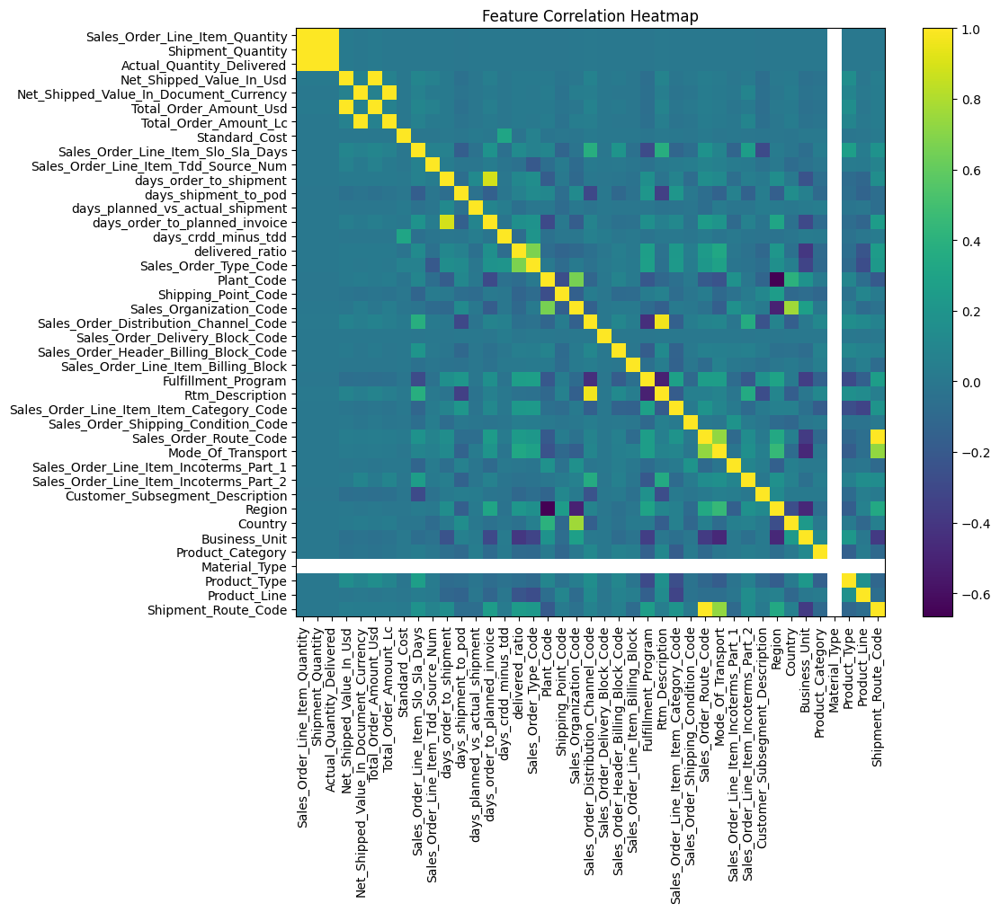

In [0]:
import matplotlib.pyplot as plt
import numpy as np

# Compute correlation matrix
corr_matrix = X_corr.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
plt.imshow(corr_matrix, interpolation='nearest')
plt.colorbar()

# Add ticks
plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, rotation=90)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns)

plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

### Drop Highly Correlated Features

In [0]:
# Features to drop (one from each correlated pair/cluster)
cols_to_drop = [
    "Shipment_Quantity",              # ~1.0 corr with Sales_Order_Line_Item_Quantity
    "Actual_Quantity_Delivered",       # ~1.0 corr with Sales_Order_Line_Item_Quantity
    "Total_Order_Amount_Usd",         # ~0.999 corr with Net_Shipped_Value_In_Usd
    "Total_Order_Amount_Lc",          # ~1.0 corr with Net_Shipped_Value_In_Document_Currency
    "days_order_to_planned_invoice",  # ~0.89 corr with days_order_to_shipment
    "Rtm_Description",                # ~0.96 corr with Sales_Order_Distribution_Channel_Code
    "Shipment_Route_Code",            # ~0.998 corr with Sales_Order_Route_Code
]

# Only drop columns that actually exist in the dataframes
cols_existing = [c for c in cols_to_drop if c in X_train.columns]

X_train_reduced = X_train.drop(columns=cols_existing)
X_valid_reduced = X_valid.drop(columns=cols_existing)

print(f"Dropped {len(cols_existing)} redundant features: {cols_existing}")
print(f"Remaining features: {X_train_reduced.shape[1]} (was {X_train.shape[1]})")
print(f"\nKept representatives:")
print("  Sales_Order_Line_Item_Quantity  (for quantity cluster)")
print("  Net_Shipped_Value_In_Usd        (for USD value cluster)")
print("  Net_Shipped_Value_In_Document_Currency (for local currency cluster)")
print("  days_order_to_shipment          (for date-delta pair)")
print("  Sales_Order_Distribution_Channel_Code (for channel/RTM pair)")
print("  Sales_Order_Route_Code           (for route pair)")

Dropped 7 redundant features: ['Shipment_Quantity', 'Actual_Quantity_Delivered', 'Total_Order_Amount_Usd', 'Total_Order_Amount_Lc', 'days_order_to_planned_invoice', 'Rtm_Description', 'Shipment_Route_Code']
Remaining features: 34 (was 41)

Kept representatives:
  Sales_Order_Line_Item_Quantity  (for quantity cluster)
  Net_Shipped_Value_In_Usd        (for USD value cluster)
  Net_Shipped_Value_In_Document_Currency (for local currency cluster)
  days_order_to_shipment          (for date-delta pair)
  Sales_Order_Distribution_Channel_Code (for channel/RTM pair)
  Sales_Order_Route_Code           (for route pair)


### XGBoost on Reduced Feature Set

In [0]:
# ============================================================
# XGBoost on the REDUCED feature set (correlated cols dropped)
# ============================================================
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier
from sklearn.metrics import (
    roc_auc_score, average_precision_score, precision_recall_curve,
    classification_report, confusion_matrix
)

# --- Derive reduced feature lists from the actual columns ---
cols_dropped = [
    "Shipment_Quantity", "Actual_Quantity_Delivered",
    "Total_Order_Amount_Usd", "Total_Order_Amount_Lc",
    "days_order_to_planned_invoice",
    "Rtm_Description", "Shipment_Route_Code",
]
num_keep_reduced  = [c for c in numerical_features  if c not in cols_dropped and c in X_train_reduced.columns]
cat_keep_reduced  = [c for c in categorical_features1 if c not in cols_dropped and c in X_train_reduced.columns]

print(f"Reduced numeric  features ({len(num_keep_reduced)}): {num_keep_reduced}")
print(f"Reduced categorical features ({len(cat_keep_reduced)}): {cat_keep_reduced}")

# --- Rebuild preprocessor for the reduced set ---
cat_pipe_r = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", make_ohe()),
])

num_pipe_r = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
])

preprocessor_reduced = ColumnTransformer(
    transformers=[
        ("cat", cat_pipe_r, cat_keep_reduced),
        ("num", num_pipe_r, num_keep_reduced),
    ],
    remainder="drop"
)

# --- Imbalance weight ---
pos_weight_r = y_train.value_counts().get(0, 0) / max(y_train.value_counts().get(1, 1), 1)

# --- XGBoost pipeline on reduced features ---
pipe_xgb_reduced = Pipeline(steps=[
    ("coerce_num", ToNumeric(num_keep_reduced)),
    ("preprocess", preprocessor_reduced),
    ("model", XGBClassifier(
        n_estimators=500, max_depth=4, learning_rate=0.05,
        subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0,
        tree_method="hist", scale_pos_weight=pos_weight_r,
        random_state=42, n_jobs=-1, eval_metric="logloss"
    ))
])

# --- Train & evaluate using the existing evaluate() function ---
evaluate(pipe_xgb_reduced, "XGBoost (Reduced Features)",
         X_train_reduced, y_train, X_valid_reduced, y_valid,
         target_recall=TARGET_RECALL)

Reduced numeric  features (11): ['Sales_Order_Line_Item_Quantity', 'Net_Shipped_Value_In_Usd', 'Net_Shipped_Value_In_Document_Currency', 'Standard_Cost', 'Sales_Order_Line_Item_Slo_Sla_Days', 'Sales_Order_Line_Item_Tdd_Source_Num', 'days_order_to_shipment', 'days_shipment_to_pod', 'days_planned_vs_actual_shipment', 'days_crdd_minus_tdd', 'delivered_ratio']
Reduced categorical features (23): ['Sales_Order_Type_Code', 'Plant_Code', 'Shipping_Point_Code', 'Sales_Organization_Code', 'Sales_Order_Distribution_Channel_Code', 'Sales_Order_Delivery_Block_Code', 'Sales_Order_Header_Billing_Block_Code', 'Sales_Order_Line_Item_Billing_Block', 'Fulfillment_Program', 'Sales_Order_Line_Item_Item_Category_Code', 'Sales_Order_Shipping_Condition_Code', 'Sales_Order_Route_Code', 'Mode_Of_Transport', 'Sales_Order_Line_Item_Incoterms_Part_1', 'Sales_Order_Line_Item_Incoterms_Part_2', 'Customer_Subsegment_Description', 'Region', 'Country', 'Business_Unit', 'Product_Category', 'Material_Type', 'Product_Type

In [0]:
# ============================================================
# Hyperparameter Tuning — XGBoost on Reduced Feature Set
# ============================================================
from sklearn.model_selection import RandomizedSearchCV

# Speed-friendly base params for search
pipe_xgb_reduced.set_params(
    model__n_estimators=300,
    model__learning_rate=0.10,
    model__tree_method="hist",
    model__n_jobs=-1,
    model__random_state=42,
    model__eval_metric="logloss"
)

# Parameter search space (same grid as full-feature XGBoost tuning)
param_dist_xgb_reduced = {
    "model__max_depth":          [3, 4, 5, 6, 8],
    "model__min_child_weight":   [1, 2, 4, 6, 8],
    "model__gamma":              [0.0, 0.1, 0.2],
    "model__subsample":          [0.7, 0.8, 0.9],
    "model__colsample_bytree":   [0.6, 0.8],
    "model__reg_lambda":         [0.0, 1.0, 2.0],
    "model__reg_alpha":          [0.0, 0.5, 1.0],
    "model__n_estimators":       [300, 500, 700, 900],
    "model__learning_rate":      [0.07, 0.10],
}

xgb_reduced_search = RandomizedSearchCV(
    estimator=pipe_xgb_reduced,
    param_distributions=param_dist_xgb_reduced,
    n_iter=10,
    scoring="average_precision",   # PR-AUC
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42,
    return_train_score=False
)

xgb_reduced_search.fit(X_train_reduced, y_train)

print(f"\nBest PR-AUC (CV): {xgb_reduced_search.best_score_:.4f}")
print(f"Best params: {xgb_reduced_search.best_params_}")

best_xgb_reduced = xgb_reduced_search.best_estimator_

Fitting 3 folds for each of 10 candidates, totalling 30 fits

Best PR-AUC (CV): 0.9986
Best params: {'model__subsample': 0.9, 'model__reg_lambda': 0.0, 'model__reg_alpha': 0.0, 'model__n_estimators': 900, 'model__min_child_weight': 8, 'model__max_depth': 8, 'model__learning_rate': 0.1, 'model__gamma': 0.0, 'model__colsample_bytree': 0.8}


### Evaluate Tuned XGBoost (Reduced Features)

In [0]:
# ============================================================
# Evaluate tuned XGBoost (Reduced) at multiple thresholds
# ============================================================

# Single default-threshold evaluation
evaluate_model(
    best_xgb_reduced,
    X_valid_reduced,
    y_valid,
    threshold=0.5,
    model_name="XGBoost Reduced (Tuned, t=0.5)"
)

# Sweep across thresholds
print("\n" + "="*60)
print("Threshold sweep — XGBoost Reduced (Tuned)")
print("="*60)

thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]
for t in thresholds:
    evaluate_model(
        best_xgb_reduced,
        X_valid_reduced,
        y_valid,
        threshold=t,
        model_name=f"XGBoost Reduced (t={t})"
    )

# Pick the best threshold by F1
xgb_red_table, xgb_red_best = pick_best_threshold(
    best_xgb_reduced, X_valid_reduced, y_valid, thresholds,
    metric="f1",
    greater_is_better=True,
    tie_break=("recall", "precision", "threshold")
)

print("\n--- Best threshold summary (Reduced XGBoost) ---")
print(xgb_red_table)
print(f"\nSelected threshold: {xgb_red_best}")


===== XGBoost Reduced (Tuned, t=0.5) Evaluation (threshold=0.5) =====
ROC-AUC : 0.9972
PR-AUC  : 0.9988

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96     30096
           1       0.99      0.97      0.98     64500

    accuracy                           0.98     94596
   macro avg       0.97      0.98      0.97     94596
weighted avg       0.98      0.98      0.98     94596

Confusion Matrix:
[[29609   487]
 [ 1703 62797]]

Threshold sweep — XGBoost Reduced (Tuned)

===== XGBoost Reduced (t=0.3) Evaluation (threshold=0.3) =====
ROC-AUC : 0.9972
PR-AUC  : 0.9988

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97     30096
           1       0.98      0.99      0.98     64500

    accuracy                           0.98     94596
   macro avg       0.98      0.97      0.97     94596
weighted avg       0.98      0.98      0.98     94596

Con

## Feature Importance 


### Permutation Importance 

In [0]:
from sklearn.inspection import permutation_importance
import pandas as pd

def get_permutation_importance(model, X, y, scoring="average_precision"):
    result = permutation_importance(
        model,
        X,
        y,
        n_repeats=10,
        random_state=42,
        n_jobs=-1,
        scoring=scoring
    )

    # Get raw input feature names (permutation importance operates on input columns)
    feature_names = X.columns

    importance_df = pd.DataFrame({
        "feature": feature_names,
        "importance_mean": result.importances_mean,
        "importance_std": result.importances_std
    }).sort_values(by="importance_mean", ascending=False)

    return importance_df

# Use the tuned XGBoost on reduced features, evaluated on the validation (test) set
perm_df = get_permutation_importance(best_xgb_reduced, X_valid_reduced, y_valid)

print(perm_df.head(20))

[CV] END model__colsample_bytree=0.8, model__gamma=0.0, model__learning_rate=0.1, model__max_depth=8, model__min_child_weight=8, model__n_estimators=900, model__reg_alpha=0.0, model__reg_lambda=0.0, model__subsample=0.9; total time=  47.6s
[CV] END model__colsample_bytree=0.8, model__gamma=0.0, model__learning_rate=0.1, model__max_depth=8, model__min_child_weight=8, model__n_estimators=900, model__reg_alpha=0.0, model__reg_lambda=0.0, model__subsample=0.9; total time=  48.1s
[CV] END model__colsample_bytree=0.8, model__gamma=0.0, model__learning_rate=0.1, model__max_depth=8, model__min_child_weight=8, model__n_estimators=900, model__reg_alpha=0.0, model__reg_lambda=0.0, model__subsample=0.9; total time=  47.6s


/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


                                     feature  importance_mean  importance_std
7                       days_shipment_to_pod         0.016474        0.000116
27                                    Region         0.007683        0.000121
14                   Sales_Organization_Code         0.006660        0.000088
15     Sales_Order_Distribution_Channel_Code         0.005999        0.000078
26           Customer_Subsegment_Description         0.005084        0.000095
6                     days_order_to_shipment         0.004080        0.000099
22                    Sales_Order_Route_Code         0.003493        0.000049
19                       Fulfillment_Program         0.002090        0.000041
9                        days_crdd_minus_tdd         0.001247        0.000020
25    Sales_Order_Line_Item_Incoterms_Part_2         0.000930        0.000022
0             Sales_Order_Line_Item_Quantity         0.000736        0.000023
4         Sales_Order_Line_Item_Slo_Sla_Days         0.000541   

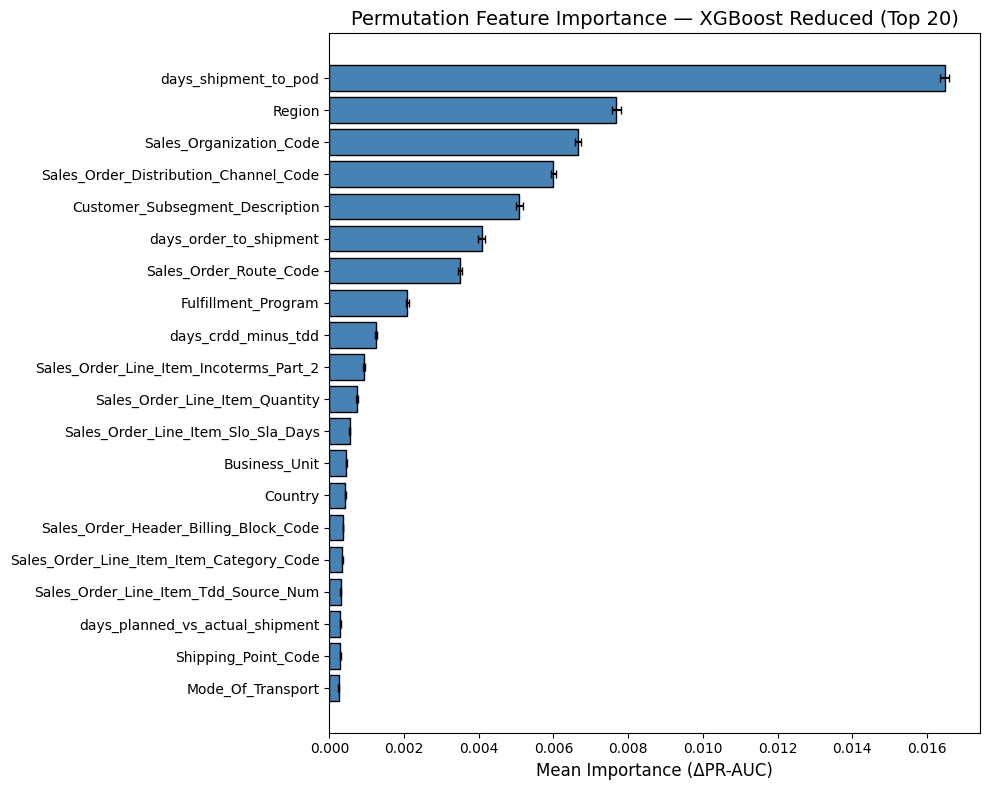

In [0]:
import matplotlib.pyplot as plt

top_n = 20
top_features = perm_df.head(top_n).sort_values(by="importance_mean", ascending=True)

fig, ax = plt.subplots(figsize=(10, 8))
ax.barh(
    top_features["feature"],
    top_features["importance_mean"],
    xerr=top_features["importance_std"],
    color="steelblue",
    edgecolor="black",
    capsize=3
)
ax.set_xlabel("Mean Importance (ΔPR-AUC)", fontsize=12)
ax.set_title("Permutation Feature Importance — XGBoost Reduced (Top 20)", fontsize=14)
ax.tick_params(axis="y", labelsize=10)
plt.tight_layout()
plt.show()